# تشکیل پرتفو در بازار بورس تهران

In [1]:
import numpy as np
import pandas as pd
import finpy_tse as tse
import mplfinance as mplf
import scipy.stats as stt
import matplotlib.pyplot as plt
import mahdi as msj

In [9]:
tickers  = ["folad","shapna","khodro" , "khesapa" ,"famili","ghegol","mellat" , "setran" , "shafan" ]

stocks = pd.DataFrame()
for stock_name in tickers:
    stock = pd.read_excel("{}.xlsx".format(stock_name))
    stock.drop( "Unnamed: 0", inplace=True, axis=1)
    stock.drop(index = stock.index[0:6] , inplace=True)
    stock.rename(columns = stock.iloc[0] , inplace = True)
    stock.set_index('تاریخ میلادی' , inplace = True)
    stock = stock.drop(['تاریخ میلادی'] , axis = 0)
    
    df = stock["قیمت تعدیلی"].to_frame()
    df.columns = [stock_name]
    
    df[stock_name] = df[stock_name].replace(['-'], '')
    df[stock_name] = pd.to_numeric(df[stock_name])
    df = df.iloc[::-1]
    df.fillna(method='ffill', inplace=True)
    
    
    stocks[stock_name] = df[stock_name]

stocks = stocks.drop(index = stocks.index[0:3])
stocks.dropna(inplace = True)
stocks = round(stocks , 2)

In [10]:
stocks

,folad,shapna,khodro,khesapa,famili,ghegol,mellat,setran,shafan
تاریخ میلادی,,,,,,,,,
2012-03-27,71.46,47.84,61.50,66.65,111.12,26.13,72.33,923.19,53.40
2012-03-28,71.57,46.56,60.77,66.72,111.78,26.13,71.87,865.11,55.50
2012-04-02,69.41,46.71,59.76,64.44,109.10,26.13,70.71,867.13,56.43
2012-04-03,68.39,45.70,59.39,62.81,108.55,26.13,69.32,863.10,54.76
2012-04-04,69.39,45.70,59.23,61.97,108.57,26.13,68.62,853.02,57.64
...,...,...,...,...,...,...,...,...,...
2022-12-31,5910.00,7630.00,2864.00,2342.00,7310.00,5970.00,3070.00,33430.00,6020.00
2023-01-01,5920.00,7610.00,2950.00,2374.00,7350.00,5700.00,3025.00,32510.00,5900.00
2023-01-02,5960.00,7740.00,3080.00,2494.00,7460.00,5800.00,3056.00,33120.00,5940.00


### **!حال دیگر داده های ما تمیز تمیز شد**  

In [11]:
daily_rets = msj.compute_returns(stocks)
daily_rets.dropna(inplace = True)
daily_rets#.tail()

,folad,shapna,khodro,khesapa,famili,ghegol,mellat,setran,shafan
تاریخ میلادی,,,,,,,,,
2012-03-28,0.001539,-0.026756,-0.011870,0.001050,0.005940,0.000000,-0.006360,-0.062912,0.039326
2012-04-02,-0.030180,0.003222,-0.016620,-0.034173,-0.023976,0.000000,-0.016140,0.002335,0.016757
2012-04-03,-0.014695,-0.021623,-0.006191,-0.025295,-0.005041,0.000000,-0.019658,-0.004648,-0.029594
2012-04-04,0.014622,0.000000,-0.002694,-0.013374,0.000184,0.000000,-0.010098,-0.011679,0.052593
2012-04-07,-0.010520,0.008534,-0.002195,-0.021623,0.008013,0.000000,-0.020256,0.026471,0.031575
...,...,...,...,...,...,...,...,...,...
2022-12-31,-0.060413,-0.069512,-0.004172,-0.032231,-0.049415,0.006745,-0.055385,-0.038539,-0.059375
2023-01-01,0.001692,-0.002621,0.030028,0.013664,0.005472,-0.045226,-0.014658,-0.027520,-0.019934
2023-01-02,0.006757,0.017083,0.044068,0.050548,0.014966,0.017544,0.010248,0.018763,0.006780


In [12]:
daily_rets.index = pd.to_datetime(daily_rets.index)
daily_rets.index

DatetimeIndex(['2012-03-28', '2012-04-02', '2012-04-03', '2012-04-04',
               '2012-04-07', '2012-04-08', '2012-04-09', '2012-04-10',
               '2012-04-11', '2012-04-14',
               ...
               '2022-12-21', '2022-12-24', '2022-12-25', '2022-12-26',
               '2022-12-28', '2022-12-31', '2023-01-01', '2023-01-02',
               '2023-01-03', '2023-01-04'],
              dtype='datetime64[ns]', name='تاریخ میلادی', length=2588, freq=None)

In [13]:
daily_rets = daily_rets.loc["2012" :]

In [14]:
# Annualize returns (periods = 239)
ann_rets = msj.annualize_rets(daily_rets, 239)
round(ann_rets,2)

folad      0.50
shapna     0.59
khodro     0.45
khesapa    0.40
famili     0.47
ghegol     0.64
mellat     0.42
setran     0.39
shafan     0.54
dtype: float64

In [15]:
mean_rets = daily_rets.mean()
std_rets  = daily_rets.std()
cov_rets  = daily_rets.cov()
cov_rets

,folad,shapna,khodro,khesapa,famili,ghegol,mellat,setran,shafan
folad,0.000493,0.000243,0.000148,0.000150,0.000314,0.000072,0.000175,0.000149,0.000172
shapna,0.000243,0.003133,0.000160,0.000187,0.000204,0.000116,0.000153,0.000171,0.000154
khodro,0.000148,0.000160,0.001277,0.000561,0.000140,0.000083,0.000197,0.000216,0.000072
khesapa,0.000150,0.000187,0.000561,0.001460,0.000173,0.000127,0.000236,0.000169,0.000097
famili,0.000314,0.000204,0.000140,0.000173,0.000561,0.000085,0.000170,0.000150,0.000194
ghegol,0.000072,0.000116,0.000083,0.000127,0.000085,0.001588,0.000063,0.000124,0.000042
mellat,0.000175,0.000153,0.000197,0.000236,0.000170,0.000063,0.000681,0.000149,0.000097
setran,0.000149,0.000171,0.000216,0.000169,0.000150,0.000124,0.000149,0.000793,0.000115
shafan,0.000172,0.000154,0.000072,0.000097,0.000194,0.000042,0.000097,0.000115,0.000652


اکنون 4000 پرتفوی را با وزن های تخصیص یافته به سهام فوق شبیه سازی می کنیم:

نکته:

**ابتدا با فرض نرخ بدون ریسک 0 درصد**

In [107]:
periods_per_year = 239
num_portfolios   = 4000
portfolios       = pd.DataFrame(columns=["return","volatility","sharpe ratio","w1","w2","w3","w4","w5","w6","w7","w8","w9"])
risk_free_rate   = 0.0
n_assets = stocks.shape[1]

In [109]:
for i in range(num_portfolios):
    # انتخاب وزن های تصادفی به تعداد دارایی ها
    weights = np.random.random(n_assets)
    # حال جوری تنظیمشان میکنیم که جمعشان 1 شود
    weights /= np.sum(weights)
    
    # بازده سالانه پرتفوی
    ann_rets = msj.annualize_rets(daily_rets, periods_per_year)
    portfolio_ret = msj.portfolio_return(weights, ann_rets)        

    # نوسانات سالانه پرتفوی
    portfolio_vol = msj.portfolio_vol(weights, cov_rets)
    portfolio_vol = msj.annualize_vol(portfolio_vol, periods_per_year)

    # نسبت شارپ سالانه پرتفوی
    portfolio_shpr = msj.sharpe_ratio(portfolio_ret, risk_free_rate, periods_per_year, v=portfolio_vol)
    
    # create dataframe   
    portfolios = portfolios.append( {"return":portfolio_ret, 
                                     "volatility":portfolio_vol, 
                                     "sharpe ratio":portfolio_shpr, 
                                     "w1": weights[0], "w2": weights[1], "w3": weights[2],
                                     "w4": weights[3], "w5": weights[4], "w6": weights[5],
                                     "w7": weights[6], "w8": weights[7], "w9": weights[8]}, 
                                     ignore_index=True)

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

In [23]:
portfolios.head()

,return,volatility,sharpe ratio,w1,w2,w3,w4,w5,w6,w7,w8,w9
0,0.487586,0.253144,1.926121,0.115647,0.107108,0.01621,0.073567,0.074395,0.108621,0.274694,0.102368,0.12739
1,0.496194,0.26283,1.887892,0.002079,0.010608,0.164701,0.117759,0.076006,0.20774,0.109724,0.102714,0.208668
2,0.505576,0.279726,1.807401,0.139248,0.155509,0.102887,0.116841,0.112255,0.167327,0.138469,0.031458,0.036006
3,0.455846,0.339521,1.342616,0.002217,0.037743,0.253508,0.341446,0.041525,0.108025,0.128293,0.0569,0.030343
4,0.457839,0.251792,1.818321,0.14867,0.042759,0.110171,0.097529,0.175546,0.027001,0.193355,0.153442,0.051526


In [24]:
portfolios.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   return        4000 non-null   object
 1   volatility    4000 non-null   object
 2   sharpe ratio  4000 non-null   object
 3   w1            4000 non-null   object
 4   w2            4000 non-null   object
 5   w3            4000 non-null   object
 6   w4            4000 non-null   object
 7   w5            4000 non-null   object
 8   w6            4000 non-null   object
 9   w7            4000 non-null   object
 10  w8            4000 non-null   object
 11  w9            4000 non-null   object
dtypes: object(12)
memory usage: 375.1+ KB


In [25]:
portfolios["return"] = pd.to_numeric(portfolios["return"])
portfolios["volatility"] = pd.to_numeric(portfolios["volatility"])
portfolios["sharpe ratio"] = pd.to_numeric(portfolios["sharpe ratio"])
portfolios["w1"] = pd.to_numeric(portfolios["w1"])
portfolios["w2"] = pd.to_numeric(portfolios["w2"])
portfolios["w3"] = pd.to_numeric(portfolios["w3"])
portfolios["w4"] = pd.to_numeric(portfolios["w4"])
portfolios["w5"] = pd.to_numeric(portfolios["w5"])
portfolios["w6"] = pd.to_numeric(portfolios["w6"])
portfolios["w7"] = pd.to_numeric(portfolios["w7"])
portfolios["w8"] = pd.to_numeric(portfolios["w8"])
portfolios["w9"] = pd.to_numeric(portfolios["w9"])

In [26]:
portfolios["volatility"].argmin()

2113

In [27]:
portfolios.iloc[portfolios["volatility"].argmin()]

return          0.492643
volatility      0.236425
sharpe ratio    2.083722
w1              0.168655
w2              0.005752
w3              0.049656
w4              0.008892
w5              0.135448
w6              0.116630
w7              0.198703
w8              0.095698
w9              0.220566
Name: 2113, dtype: float64

In [28]:
portfolios["sharpe ratio"].argmax()

129

In [29]:
portfolios.iloc[portfolios["sharpe ratio"].argmax()]

return          0.508941
volatility      0.241820
sharpe ratio    2.104623
w1              0.200697
w2              0.033227
w3              0.073858
w4              0.016617
w5              0.084421
w6              0.188622
w7              0.131540
w8              0.090921
w9              0.180096
Name: 129, dtype: float64

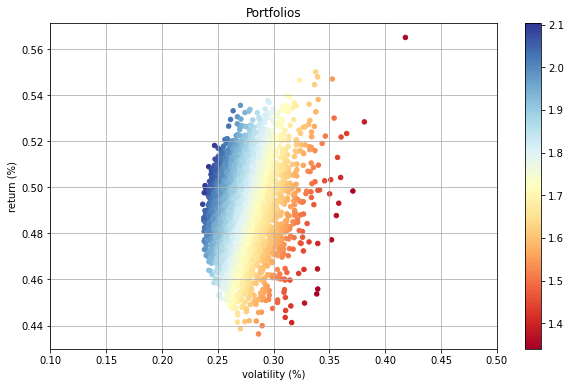

In [31]:
fig, ax = plt.subplots(1,1, figsize=(10,6)) 

im = ax.scatter(portfolios["volatility"], portfolios["return"], c=portfolios["sharpe ratio"], s=20, edgecolor=None, cmap='RdYlBu')
ax.set_title("Portfolios")
ax.set_ylabel("return (%)")
ax.grid()


ax.set_xlim([0.10,0.50])
ax.set_xlabel("volatility (%)")

fig.colorbar(im, ax=ax)
plt.show()

## مشاهده میکنیم که برای تعداد بالای دارایی 4000 شبیه سازی کافی نیست لذا این عدد را به 40000 تغییر میدهیم

### ببینیم نتیجه چه می شود

In [95]:
periods_per_year = 239
num_portfolios   = 40000
portfolios       = pd.DataFrame(columns=["return","volatility","sharpe ratio","w1","w2","w3","w4","w5","w6","w7","w8","w9"])
risk_free_rate   = 0.0
n_assets = stocks.shape[1]

In [96]:
for i in range(num_portfolios):
    # انتخاب وزن های تصادفی به تعداد دارایی ها
    weights = np.random.random(n_assets)
    # حال جوری تنظیمشان میکنیم که جمعشان 1 شود
    weights /= np.sum(weights)
    
    # بازده سالانه پرتفوی
    ann_rets = msj.annualize_rets(daily_rets, periods_per_year)
    portfolio_ret = msj.portfolio_return(weights, ann_rets)        

    # نوسانات سالانه پرتفوی
    portfolio_vol = msj.portfolio_vol(weights, cov_rets)
    portfolio_vol = msj.annualize_vol(portfolio_vol, periods_per_year)

    # نسبت شارپ سالانه پرتفوی
    portfolio_shpr = msj.sharpe_ratio(portfolio_ret, risk_free_rate, periods_per_year, v=portfolio_vol)
    
    # create dataframe   
    portfolios = portfolios.append( {"return":portfolio_ret, 
                                     "volatility":portfolio_vol, 
                                     "sharpe ratio":portfolio_shpr, 
                                     "w1": weights[0], "w2": weights[1], "w3": weights[2],
                                     "w4": weights[3], "w5": weights[4], "w6": weights[5],
                                     "w7": weights[6], "w8": weights[7], "w9": weights[8]}, 
                                     ignore_index=True)

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portfolios = portfolios.append( {"return":portfolio_ret,
C:\Users\Lenovo L3\AppData\Local\Temp\ipykernel_2292\1748338718.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  portf

In [97]:
portfolios.head()

,return,volatility,sharpe ratio,w1,w2,w3,w4,w5,w6,w7,w8,w9
0,0.483469,0.262458,1.842083,0.083031,0.130477,0.045725,0.114307,0.036045,0.112807,0.191149,0.177464,0.108995
1,0.489938,0.284542,1.721849,0.091432,0.16857,0.198774,0.053663,0.184095,0.07748,0.073705,0.109177,0.043102
2,0.460625,0.266962,1.725433,0.067555,0.098362,0.105712,0.138357,0.158324,0.00806,0.244823,0.095642,0.083164
3,0.489101,0.27194,1.798565,0.165683,0.115171,0.169078,0.125371,0.092189,0.119308,0.121047,0.061626,0.030528
4,0.512768,0.301176,1.702551,0.010296,0.192819,0.207965,0.066479,0.199963,0.165039,0.042626,0.045024,0.069788


In [98]:
portfolios.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   return        40000 non-null  object
 1   volatility    40000 non-null  object
 2   sharpe ratio  40000 non-null  object
 3   w1            40000 non-null  object
 4   w2            40000 non-null  object
 5   w3            40000 non-null  object
 6   w4            40000 non-null  object
 7   w5            40000 non-null  object
 8   w6            40000 non-null  object
 9   w7            40000 non-null  object
 10  w8            40000 non-null  object
 11  w9            40000 non-null  object
dtypes: object(12)
memory usage: 3.7+ MB


In [99]:
portfolios["return"] = pd.to_numeric(portfolios["return"])
portfolios["volatility"] = pd.to_numeric(portfolios["volatility"])
portfolios["sharpe ratio"] = pd.to_numeric(portfolios["sharpe ratio"])
portfolios["w1"] = pd.to_numeric(portfolios["w1"])
portfolios["w2"] = pd.to_numeric(portfolios["w2"])
portfolios["w3"] = pd.to_numeric(portfolios["w3"])
portfolios["w4"] = pd.to_numeric(portfolios["w4"])
portfolios["w5"] = pd.to_numeric(portfolios["w5"])
portfolios["w6"] = pd.to_numeric(portfolios["w6"])
portfolios["w7"] = pd.to_numeric(portfolios["w7"])
portfolios["w8"] = pd.to_numeric(portfolios["w8"])
portfolios["w9"] = pd.to_numeric(portfolios["w9"])

In [100]:
portfolios["volatility"].argmin()

13881

In [101]:
portfolios.iloc[portfolios["volatility"].argmin()]

return          0.486965
volatility      0.235578
sharpe ratio    2.067104
w1              0.155180
w2              0.015776
w3              0.052681
w4              0.009697
w5              0.136217
w6              0.113759
w7              0.161219
w8              0.165161
w9              0.190310
Name: 13881, dtype: float64

In [102]:
portfolios["sharpe ratio"].argmax()

18464

In [103]:
portfolios.iloc[portfolios["sharpe ratio"].argmax()]

return          0.514849
volatility      0.243139
sharpe ratio    2.117511
w1              0.232418
w2              0.053235
w3              0.060330
w4              0.012690
w5              0.024370
w6              0.173959
w7              0.126168
w8              0.084821
w9              0.232009
Name: 18464, dtype: float64

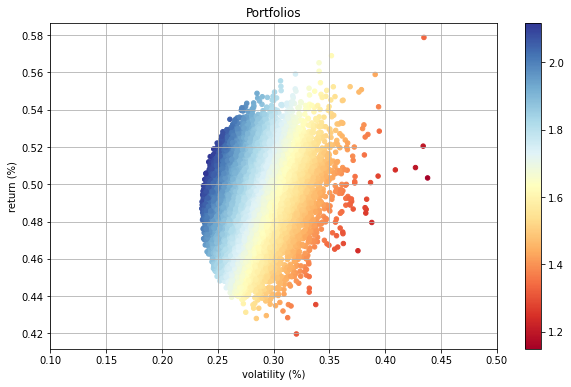

In [104]:
fig, ax = plt.subplots(1,1, figsize=(10,6)) 

im = ax.scatter(portfolios["volatility"], portfolios["return"], c=portfolios["sharpe ratio"], s=20, edgecolor=None, cmap='RdYlBu')
ax.set_title("Portfolios")
ax.set_ylabel("return (%)")
ax.grid()


ax.set_xlim([0.10,0.50])
ax.set_xlabel("volatility (%)")

fig.colorbar(im, ax=ax)
plt.show()

In [105]:
# یافتن پرتفو با پایین ترین ریسک
low_vol_portfolio = portfolios.iloc[ portfolios["volatility"].idxmin() ]
print(36 * "-")
print("Global Minimum Volatility portfolio:")
print(36 * "-")
print("- return      : {:.2f}%".format(low_vol_portfolio[0]*100) )
print("- volatility  : {:.2f}%".format(low_vol_portfolio[1]*100) )
print("- sharpe ratio: {:.2f}".format(low_vol_portfolio[2]) )

# یافتن پرتفو با بالا ترین نسبت شارپ
high_sharpe_portfolio = portfolios.iloc[ portfolios['sharpe ratio'].idxmax() ]
print(36 * "-")
print("Maximum Sharpe Ratio portfolio:")
print(36 * "-")
print("- return      : {:.2f}%".format(high_sharpe_portfolio[0]*100) )
print("- volatility  : {:.2f}%".format(high_sharpe_portfolio[1]*100) )
print("- sharpe ratio: {:.2f}".format(high_sharpe_portfolio[2]) )

------------------------------------
Global Minimum Volatility portfolio:
------------------------------------
- return      : 48.70%
- volatility  : 23.56%
- sharpe ratio: 2.07
------------------------------------
Maximum Sharpe Ratio portfolio:
------------------------------------
- return      : 51.48%
- volatility  : 24.31%
- sharpe ratio: 2.12


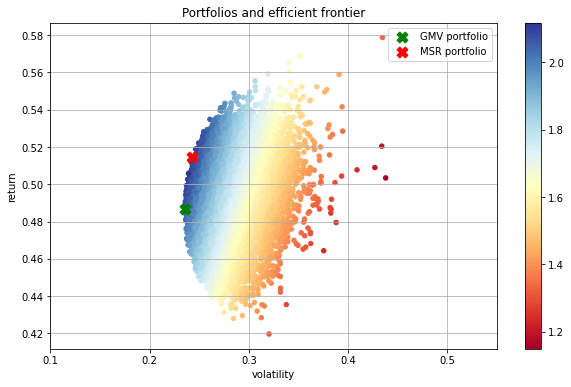

In [106]:
fig, ax = plt.subplots(1,1, figsize=(10,6)) 

im = ax.scatter(portfolios["volatility"], portfolios["return"], c=portfolios["sharpe ratio"], s=20, edgecolor=None, label=None, cmap='RdYlBu')
ax.set_title("Portfolios and efficient frontier")
ax.set_xlabel("volatility")
ax.set_ylabel("return")
ax.grid()

# مشخص کردن دو نقطه حساس ما در نمودار
ax.scatter(low_vol_portfolio[1],     low_vol_portfolio[0],     marker="X", color='g', s=120, label="GMV portfolio")
ax.scatter(high_sharpe_portfolio[1], high_sharpe_portfolio[0], marker="X", color='r', s=120, label="MSR portfolio")

ax.set_xlim([0.10,0.55])
ax.legend()

fig.colorbar(im, ax=ax)
plt.show()

In [35]:
#  کل بازده (سالانه) شرکت هایی را که در آنها سرمایه گذاری می کنیم ببینیم
ann_rets = msj.annualize_rets(daily_rets, periods_per_year)
ann_rets

folad      0.502720
shapna     0.594697
khodro     0.445752
khesapa    0.404562
famili     0.473094
ghegol     0.639433
mellat     0.419765
setran     0.389319
shafan     0.541254
dtype: float64

اکنون می‌توانیم حداقل کننده خود را فرا بخوانیم که مشکل کمینه‌سازی یافتن وزن پرتفوی با حداقل نوسان را حل می‌کند.

In [37]:
optimal_weights = msj.minimize_volatility(ann_rets, cov_rets)
print("optimal weights:")
print(18 * "-")
print("  folad : {:.2f}%".format(optimal_weights[0]*100))
print("  shapna :   {:.2f}%".format(optimal_weights[1]*100))
print("  khodro : {:.2f}%".format(optimal_weights[2]*100))
print("  khesapa : {:.2f}%".format(optimal_weights[3]*100))
print("  famili :   {:.2f}%".format(optimal_weights[4]*100))
print("  ghegol : {:.2f}%".format(optimal_weights[5]*100))
print("  mellat : {:.2f}%".format(optimal_weights[6]*100))
print("  setran :   {:.2f}%".format(optimal_weights[7]*100))
print("  shafan : {:.2f}%".format(optimal_weights[8]*100))

optimal weights:
------------------
  folad : 15.79%
  shapna :   1.91%
  khodro : 6.19%
  khesapa : 3.31%
  famili :   14.12%
  ghegol : 10.34%
  mellat : 15.54%
  setran :   13.83%
  shafan : 18.97%


In [38]:
portfolios.iloc[portfolios["volatility"].argmin()]

return          0.492643
volatility      0.236425
sharpe ratio    2.083722
w1              0.168655
w2              0.005752
w3              0.049656
w4              0.008892
w5              0.135448
w6              0.116630
w7              0.198703
w8              0.095698
w9              0.220566
Name: 2113, dtype: float64

In [39]:
def get_portfolio_features(weights, rets, covmat, risk_free_rate, periods_per_year):
    # portfolio volatility
    vol = msj.portfolio_vol(weights, covmat)
    vol = msj.annualize_vol(vol, periods_per_year)

    # portfolio return
    ret = msj.portfolio_return(weights, rets)

    # portfolio sharpe ratio
    shp = msj.sharpe_ratio(ret, risk_free_rate, periods_per_year, v=vol)

    print("Portfolio return:       {:.2f}%" .format(ret*100))
    print("Portfolio volatility:   {:.2f}%" .format(vol*100))
    print("Portfolio sharpe ratio: {:.2f}" .format(shp))
    
    return ret, vol, shp

Portfolio return:       48.64%
Portfolio volatility:   23.46%
Portfolio sharpe ratio: 2.07


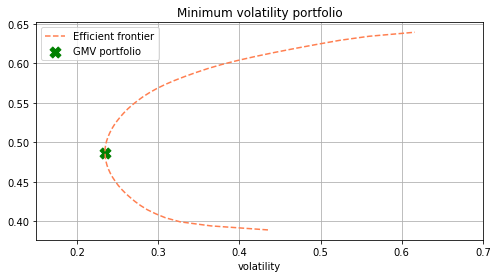

In [41]:
ret, vol, shp = get_portfolio_features(optimal_weights, ann_rets, cov_rets, risk_free_rate, periods_per_year)

# Draw the efficient frontier
fig, ax = plt.subplots(1,1, figsize=(8,4)) 
df = msj.efficient_frontier(50, daily_rets, cov_rets, periods_per_year)
df.plot.line(x="volatility", y="return", style="--", color="coral", ax=ax, grid=True, label="Efficient frontier")
ax.scatter(vol, ret,  marker="X", color='g', s=120, label="GMV portfolio")
ax.set_xlim([0.15,0.70])
ax.legend()
ax.set_title("Minimum volatility portfolio")
plt.show()

#### یافتن پرتفوی بهینه: با به حداقل رساندن نوسانات با بازده ثابت

اگر بخواهیم پورتفولیو (در مرز کارا) با حداقل نوسان برای یک سطح بازده معین پیدا کنیم، چه؟

در این مورد، ما به سادگی باید یک محدودیت در مسئله کمینه سازی اضافه کنیم:
$$
\text{minimize} \;\; \frac{1}{2} \mathbf{w}^T\Sigma\mathbf{w}, 
$$
subject to 
$$
\begin{cases}
\mathbf{w}^T \mathbf{R} = R_0, \\
\mathbf{w}^T \mathbf{1} = 1, \\
0 \leq \mathbf{w} \leq 1.
\end{cases}
$$
$R_0$ ===> سطح ثابتی از بازده می باشد

به عنوان مثال فرض کنید که ما بازده ثابت 53 درصد مد نظرمان است

In [54]:
target_return = 0.50

اکنون ما با فراخواندن تابع حداقل کننده می آییم مسئله را با محدودیت جدید حل میکنیم

In [55]:
optimal_weights = msj.minimize_volatility(ann_rets, cov_rets, target_return)
print("optimal weights:")
print(22*"-")
print("  folad : {:.2f}%".format(optimal_weights[0]*100))
print("  shapna :   {:.2f}%".format(optimal_weights[1]*100))
print("  khodro : {:.2f}%".format(optimal_weights[2]*100))
print("  khesapa : {:.2f}%".format(optimal_weights[3]*100))
print("  famili :   {:.2f}%".format(optimal_weights[4]*100))
print("  ghegol : {:.2f}%".format(optimal_weights[5]*100))
print("  mellat : {:.2f}%".format(optimal_weights[6]*100))
print("  setran :   {:.2f}%".format(optimal_weights[7]*100))
print("  shafan : {:.2f}%".format(optimal_weights[8]*100))

optimal weights:
----------------------
  folad : 17.92%
  shapna :   2.75%
  khodro : 6.89%
  khesapa : 2.36%
  famili :   11.12%
  ghegol : 12.62%
  mellat : 13.87%
  setran :   9.19%
  shafan : 23.28%


اجازه دهید نوسانات پورتفولیوی ساخته شده با این وزن ها را محاسبه کنیم.


In [56]:
ret, vol, shp = get_portfolio_features(optimal_weights, ann_rets, cov_rets, risk_free_rate, periods_per_year)

Portfolio return:       50.00%
Portfolio volatility:   23.60%
Portfolio sharpe ratio: 2.12


In [58]:
optimal_weights = msj.maximize_sharpe_ratio(ann_rets, cov_rets, risk_free_rate, periods_per_year)
print("optimal weights:")
print(22*"-")
print("  folad : {:.2f}%".format(optimal_weights[0]*100))
print("  shapna :   {:.2f}%".format(optimal_weights[1]*100))
print("  khodro : {:.2f}%".format(optimal_weights[2]*100))
print("  khesapa : {:.2f}%".format(optimal_weights[3]*100))
print("  famili :   {:.2f}%".format(optimal_weights[4]*100))
print("  ghegol : {:.2f}%".format(optimal_weights[5]*100))
print("  mellat : {:.2f}%".format(optimal_weights[6]*100))
print("  setran :   {:.2f}%".format(optimal_weights[7]*100))
print("  shafan : {:.2f}%".format(optimal_weights[8]*100))

optimal weights:
----------------------
  folad : 21.63%
  shapna :   3.59%
  khodro : 6.78%
  khesapa : 1.17%
  famili :   7.91%
  ghegol : 15.22%
  mellat : 11.85%
  setran :   6.46%
  shafan : 25.38%


In [59]:
ret, vol, shp = get_portfolio_features(optimal_weights, ann_rets, cov_rets, risk_free_rate, periods_per_year)

Portfolio return:       51.21%
Portfolio volatility:   24.02%
Portfolio sharpe ratio: 2.13


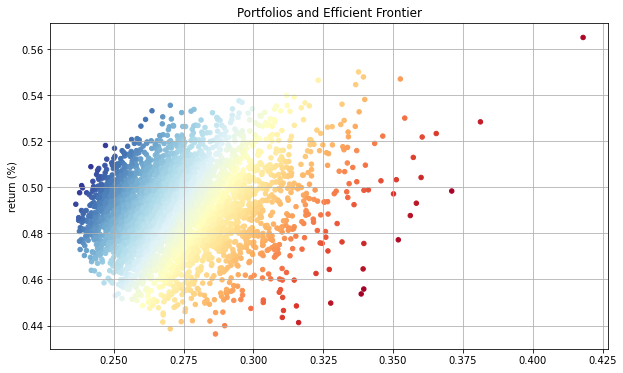

In [60]:
fig, ax = plt.subplots(1,1, figsize=(10,6)) 

im = ax.scatter(portfolios["volatility"], portfolios["return"], c=portfolios["sharpe ratio"], s=20, edgecolor=None, cmap='RdYlBu')
ax.set_title("Portfolios and Efficient Frontier")
ax.set_ylabel("return (%)")
ax.grid()


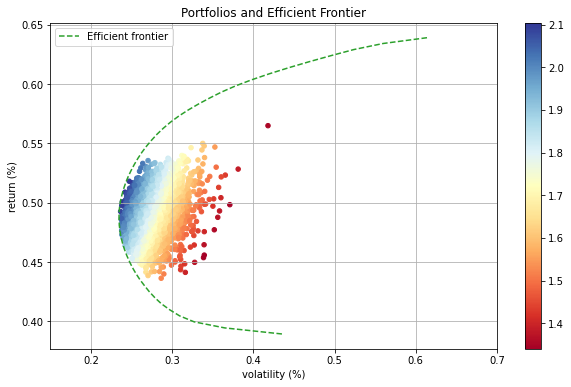

In [62]:
fig, ax = plt.subplots(1,1, figsize=(10,6)) 

im = ax.scatter(portfolios["volatility"], portfolios["return"], c=portfolios["sharpe ratio"], s=20, edgecolor=None, cmap='RdYlBu')
ax.set_title("Portfolios and Efficient Frontier")
ax.set_ylabel("return (%)")
ax.grid()

# رسم مرز کارا
df = msj.efficient_frontier(50, daily_rets, cov_rets, periods_per_year)
df.plot.line(x="volatility", y="return", style="--", color="tab:green", ax=ax, grid=True, label="Efficient frontier")
ax.set_xlim([0.15,0.70])
ax.set_xlabel("volatility (%)")

fig.colorbar(im, ax=ax)
plt.show()

Portfolio return:       51.21%
Portfolio volatility:   24.02%
Portfolio sharpe ratio: 2.13


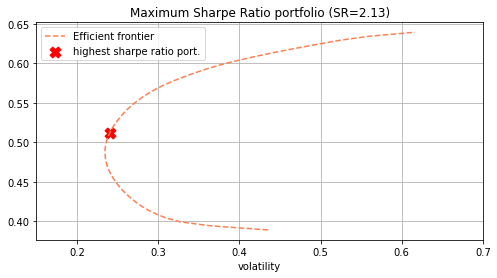

In [64]:
ret, vol, shp = get_portfolio_features(optimal_weights, ann_rets, cov_rets, risk_free_rate, periods_per_year)

# رسم مرز کارا
fig, ax = plt.subplots(1,1, figsize=(8,4)) 
df = msj.efficient_frontier(50, daily_rets, cov_rets, periods_per_year)
df.plot.line(x="volatility", y="return", style="--", color="coral", ax=ax, grid=True, label="Efficient frontier")
ax.scatter(vol, ret,  marker="X", color='r', s=120, label="highest sharpe ratio port.")
ax.set_xlim([0.15,0.70])
ax.legend()
ax.set_title("Maximum Sharpe Ratio portfolio (SR={:.2f})".format(shp))
plt.show()

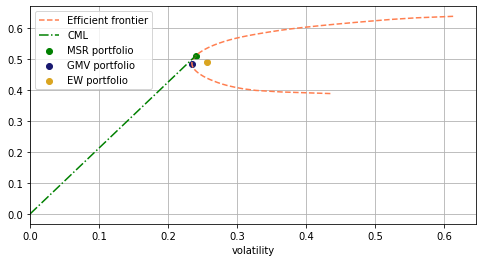

In [65]:
df = msj.efficient_frontier(50, daily_rets, cov_rets, periods_per_year , iplot = True , hsr = True , cml = True , mvp = True , ewp = True)

### به حداکثر رساندن پرتفوی نسبت شارپ در حضور نرخ بدون ریسک غیر صفر


In [67]:
risk_free_rate = 0.25
optimal_weights = msj.maximize_sharpe_ratio(ann_rets, cov_rets, risk_free_rate, periods_per_year)
print("optimal weights:")
print("  folad : {:.2f}%".format(optimal_weights[0]*100))
print("  shapna :   {:.2f}%".format(optimal_weights[1]*100))
print("  khodro : {:.2f}%".format(optimal_weights[2]*100))
print("  khesapa : {:.2f}%".format(optimal_weights[3]*100))
print("  famili :   {:.2f}%".format(optimal_weights[4]*100))
print("  ghegol : {:.2f}%".format(optimal_weights[5]*100))
print("  mellat : {:.2f}%".format(optimal_weights[6]*100))
print("  setran :   {:.2f}%".format(optimal_weights[7]*100))
print("  shafan : {:.2f}%".format(optimal_weights[8]*100))

optimal weights:
  folad : 25.75%
  shapna :   5.37%
  khodro : 6.49%
  khesapa : 0.00%
  famili :   4.57%
  ghegol : 20.41%
  mellat : 6.90%
  setran :   0.00%
  shafan : 30.52%


In [68]:
ret, vol, shp = get_portfolio_features(optimal_weights, ann_rets, cov_rets, risk_free_rate, periods_per_year)

Portfolio return:       53.65%
Portfolio volatility:   25.68%
Portfolio sharpe ratio: 1.12


اجازه دهید مرز کارا و خط بازار سرمایه را با استفاده از مولفه های بهینه  در نمودار خود رسم کنیم:

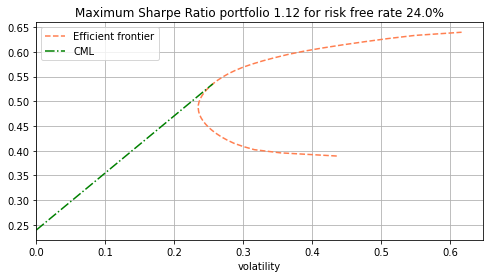

In [72]:
df, ax = msj.efficient_frontier(40, daily_rets, cov_rets, periods_per_year, risk_free_rate=risk_free_rate, 
                                iplot=True, cml=True)
ax.set_title("Maximum Sharpe Ratio portfolio {} for risk free rate {}%".format(np.round(shp,2),risk_free_rate*100))
plt.show()

معرفی دارایی بدون ریسک به عنوان یکی از اجزای جدید پرتفوی، دامنه ترکیبات نوسان-بازده موجود را بهبود بخشیده است، زیرا در همه جا، به جز در پرتفوی مماس،  بازدهی بالاتری نسبت به مرز کارا (قدیمی) در همه سطوح نوسانات ارائه می دهد.

efficient frontier method ====> توجه داشته باشید که این تابع دارای پارامتر اختیاری دیگری برای ترسیم پرتفوی با بالاترین نسبت شارپ، پرتفوی با حداقل نوسانات و همچنین پرتفوی با وزن یکسان است :

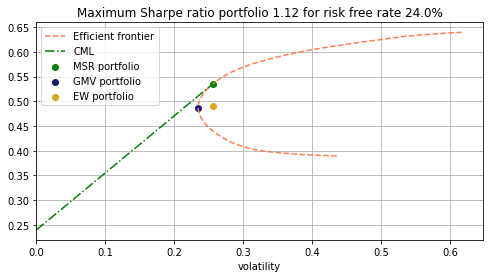

In [73]:
risk_free_rate = 0.24
df, ax = msj.efficient_frontier(90, daily_rets, cov_rets, periods_per_year, risk_free_rate=risk_free_rate, 
                                iplot=True, hsr=True, cml=True, mvp=True, ewp=True)
ax.set_title("Maximum Sharpe ratio portfolio {} for risk free rate {}%".format(np.round(shp,2),risk_free_rate*100))
plt.show()

In [77]:
invcov = msj.inverse_df(cov_rets)
ones   = np.repeat(1,9) 
r_rf   = ann_rets - risk_free_rate*ones

In [78]:
w_M = np.dot( invcov, r_rf ) / np.dot( ones, np.dot(invcov, r_rf) )
w_M

array([ 0.2564327 ,  0.052927  ,  0.07096179, -0.01157816,  0.05055408,
        0.20165252,  0.0762831 , -0.00061915,  0.30338612])

In [79]:
msj.weigths_max_sharpe_ratio(cov_rets, r_rf)

folad      0.256433
shapna     0.052927
khodro     0.070962
khesapa   -0.011578
famili     0.050554
ghegol     0.201653
mellat     0.076283
setran    -0.000619
shafan     0.303386
dtype: float64

In [80]:
msj.weigths_max_sharpe_ratio(cov_rets, r_rf).values

array([ 0.2564327 ,  0.052927  ,  0.07096179, -0.01157816,  0.05055408,
        0.20165252,  0.0762831 , -0.00061915,  0.30338612])

$\mu_M$ and $\sigma_M$ ====> حال، اجازه دهید بررسی کنیم که پرتفوی با این وزن ها مانند فرمول ها دارای بازده و نوسان است.

In [81]:
# محاسبه بازده با استفاده از روش بازده پرتفو
mu_M = msj.portfolio_return(w_M, ann_rets)
mu_M 

0.5361854593827081

In [82]:
# volatility: portfolio vol method
sigma_M = msj.annualize_vol( msj.portfolio_vol(w_M, cov_rets), periods_per_year)
sigma_M

0.25643100963352605

$$
\mathbf{w}^* 
= \underbrace{ \frac{R_0-R_f}{(\mathbf{R}-R_f\mathbf{1})^T\Sigma^{-1}(\mathbf{R}-R_f\mathbf{1})} }_{:= r} \Sigma^{-1}(\mathbf{R} - R_f\mathbf{1})
= r \Sigma^{-1}(\mathbf{R} - R_f\mathbf{1}).
$$

In [83]:
target_ret = 0.40
wstar = (target_ret - risk_free_rate) / np.dot(r_rf, np.dot(invcov,r_rf)) * np.dot(invcov,r_rf)             
wstar

array([ 0.13852548,  0.02859128,  0.0383337 , -0.00625455,  0.02730942,
        0.10893311,  0.04120829, -0.00033447,  0.16388981])

In [84]:
np.append( wstar, 1-wstar.sum() )

array([ 1.38525478e-01,  2.85912756e-02,  3.83337049e-02, -6.25454672e-03,
        2.73094205e-02,  1.08933111e-01,  4.12082888e-02, -3.34465491e-04,
        1.63889810e-01,  4.59797924e-01])

آخرین وزن در دارایی بدون ریسک است.


# سوال مهم: آیا در پرتفوی خود دلار بخریم یا خیر؟؟؟؟

اجازه دهید بررسی کنیم